In [1]:
import numpy as np
from scipy.spatial import Delaunay
import pyomo.environ as pyo
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
%matplotlib widget

In [2]:
# ======== 真实函数（也是 obj_expr ）========
def f_true_numpy(xy):
    x, y = float(xy[0]), float(xy[1])
    return 2.0*(x - 3.0)**2 + 3.0*(y - 5.0)**2

def build_model():
    m = pyo.ConcreteModel()
    m.x = pyo.Var(bounds=(0.0, 10.0))
    m.y = pyo.Var(bounds=(0.0, 10.0))
    return m

def f_true_expr(m):
    return 2*(m.x - 3)**2 + 3*(m.y - 5)**2

In [4]:
# ======== 双高斯坑目标，替代原抛物面 ========

QUADWELL_PARAMS = {
    "well1": {
        "center": np.array([3.5, 4.0], dtype=float),
        "A": np.array([[1.2, 0.0],
                       [0.0, 0.6]], dtype=float),
        "depth": 1.0,   # 原来是 5.0，调低 -> 更平缓
    },
    "well2": {
        "center": np.array([6.5, 6.0], dtype=float),
        "A": np.array([[0.7, 0.0],
                       [0.0, 1.4]], dtype=float),
        "depth": 1.0001,
    },
    "outer_bias_strength": 0.05,
    "outer_bias_center": np.array([5.0, 5.0], dtype=float),
    "offset": 0.0,
}


def f_true_numpy(xy):
    x = float(xy[0])
    y = float(xy[1])

    p  = DOUBLEWELL_PARAMS
    c1 = p["well1"]["center"]; a1 = p["well1"]["depth"]; w1 = p["well1"]["width"]
    c2 = p["well2"]["center"]; a2 = p["well2"]["depth"]; w2 = p["well2"]["width"]

    term1 = -a1 * np.exp(-((x - c1[0])**2 + (y - c1[1])**2) / (w1**2))
    term2 = -a2 * np.exp(-((x - c2[0])**2 + (y - c2[1])**2) / (w2**2))

    bc = p["outer_bias_center"]; bs = p["outer_bias_strength"]
    bias = bs * ((x - bc[0])**2 + (y - bc[1])**2)

    return term1 + term2 + bias + p["offset"]

def build_model():
    m = pyo.ConcreteModel()
    m.x = pyo.Var(bounds=(0.0, 10.0))
    m.y = pyo.Var(bounds=(0.0, 10.0))
    return m

def f_true_expr(m):
    p  = DOUBLEWELL_PARAMS

    c1x, c1y = float(p["well1"]["center"][0]), float(p["well1"]["center"][1])
    a1       = float(p["well1"]["depth"])
    w1       = float(p["well1"]["width"])

    c2x, c2y = float(p["well2"]["center"][0]), float(p["well2"]["center"][1])
    a2       = float(p["well2"]["depth"])
    w2       = float(p["well2"]["width"])

    bc_x, bc_y = float(p["outer_bias_center"][0]), float(p["outer_bias_center"][1])
    bs         = float(p["outer_bias_strength"])
    offset     = float(p["offset"])

    term1 = -a1 * pyo.exp(-(((m.x - c1x)**2 + (m.y - c1y)**2) / (w1**2)))
    term2 = -a2 * pyo.exp(-(((m.x - c2x)**2 + (m.y - c2y)**2) / (w2**2)))
    bias  = bs * ((m.x - bc_x)**2 + (m.y - bc_y)**2)

    return term1 + term2 + bias + offset


In [10]:
# ======== 双高斯井参数（无二次项） ========
DOUBLEWELL_PARAMS = {
    "well1": {
        "center": np.array([3.5, 4.0], dtype=float),
        "depth":  3.00,      # 深度（越大越深）
        "width":  2,      # 宽度（越大越平缓）
    },
    "well2": {
        "center": np.array([6.5, 6.0], dtype=float),
        "depth":  3.00 + 1e-4,  # 轻微差异，避免完全对称
        "width":  2,
    },
    "offset": 0.0,   # 整体平移项
}
def f_true_numpy(xy):
    x, y = float(xy[0]), float(xy[1])

    p  = DOUBLEWELL_PARAMS
    c1 = p["well1"]["center"]
    c2 = p["well2"]["center"]

    a1, w1 = p["well1"]["depth"], p["well1"]["width"]
    a2, w2 = p["well2"]["depth"], p["well2"]["width"]

    # 两个负高斯井
    term1 = -a1 * np.exp(-((x - c1[0])**2 + (y - c1[1])**2) / (w1**2))
    term2 = -a2 * np.exp(-((x - c2[0])**2 + (y - c2[1])**2) / (w2**2))

    return term1 + term2 + p["offset"]
def build_model():
    m = pyo.ConcreteModel()
    m.x = pyo.Var(bounds=(0.0, 10.0))
    m.y = pyo.Var(bounds=(0.0, 10.0))
    return m
def f_true_expr(m):
    p = DOUBLEWELL_PARAMS

    c1x, c1y = p["well1"]["center"]
    c2x, c2y = p["well2"]["center"]

    a1, w1 = p["well1"]["depth"], p["well1"]["width"]
    a2, w2 = p["well2"]["depth"], p["well2"]["width"]
    offset = p["offset"]

    term1 = -a1 * pyo.exp(-(((m.x - c1x)**2 + (m.y - c1y)**2) / (w1**2)))
    term2 = -a2 * pyo.exp(-(((m.x - c2x)**2 + (m.y - c2y)**2) / (w2**2)))

    return term1 + term2 + offset



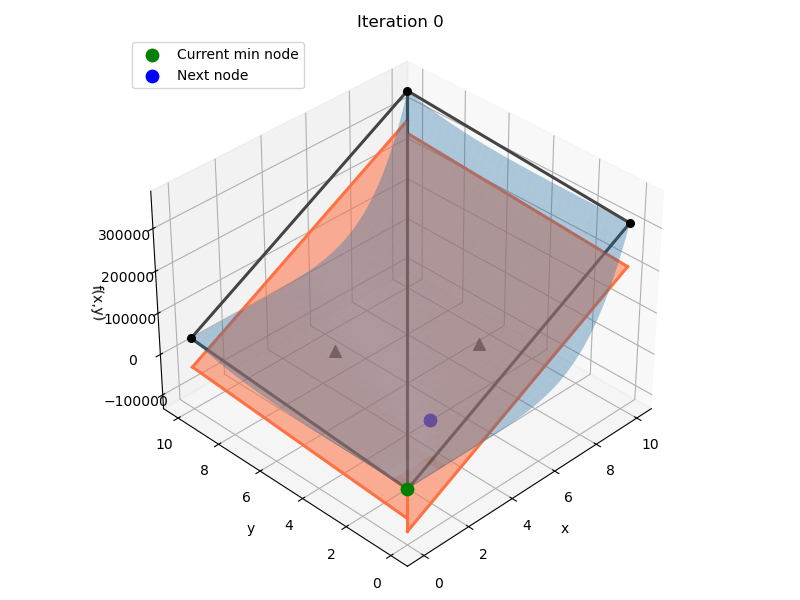

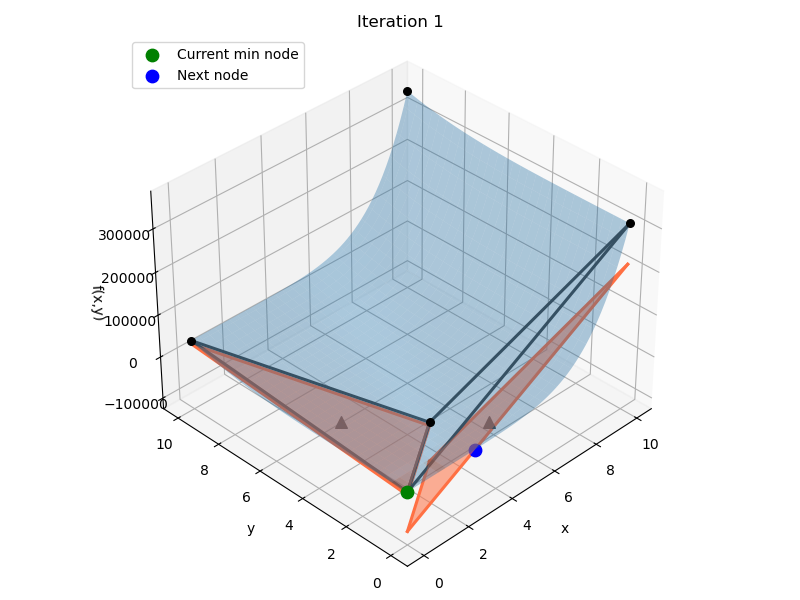

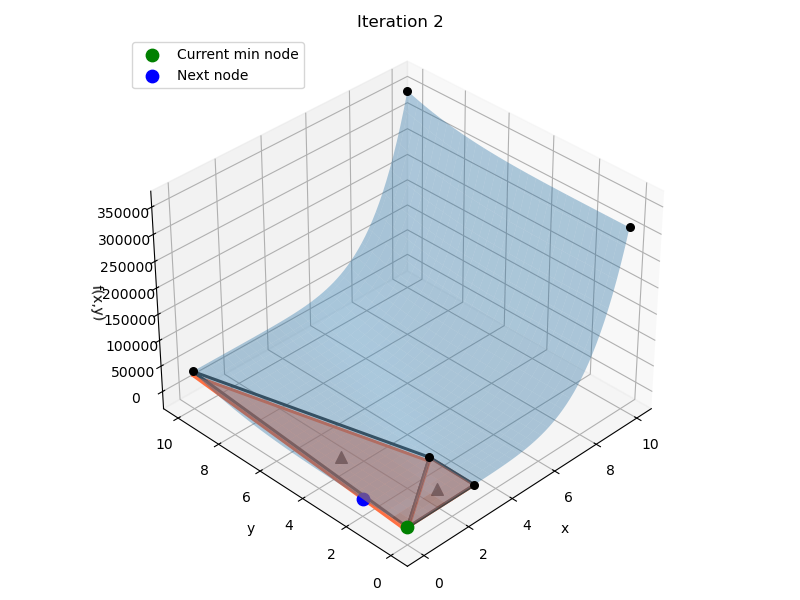

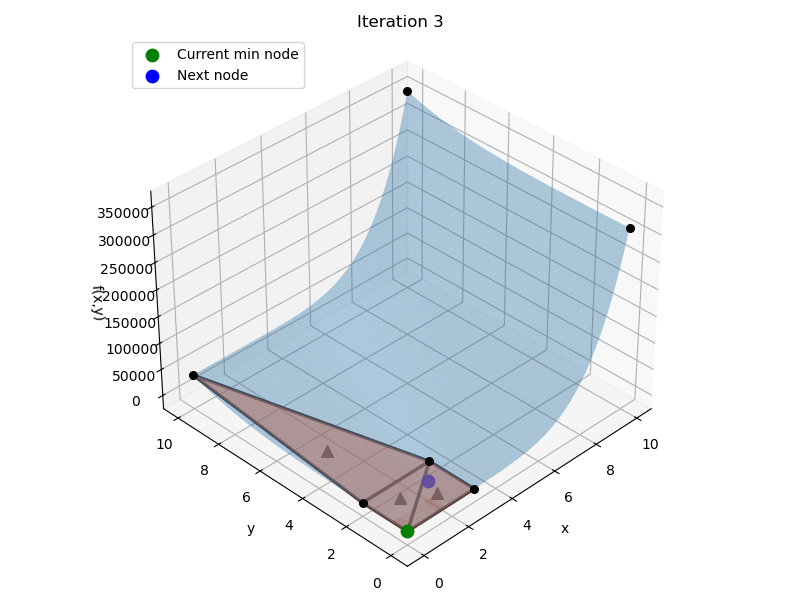

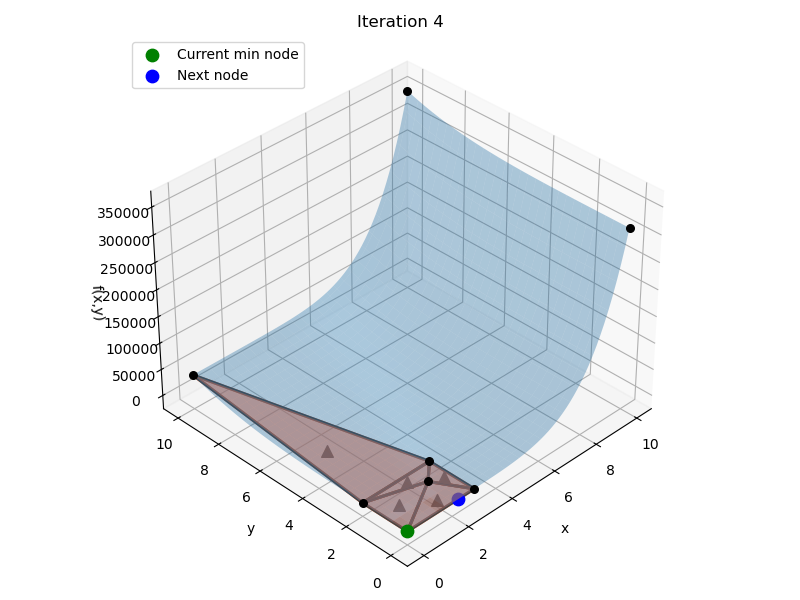

...

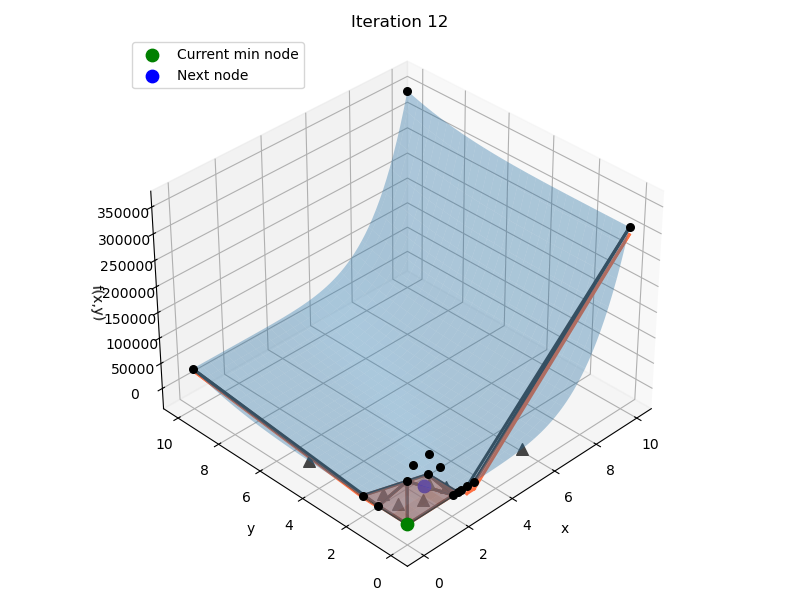

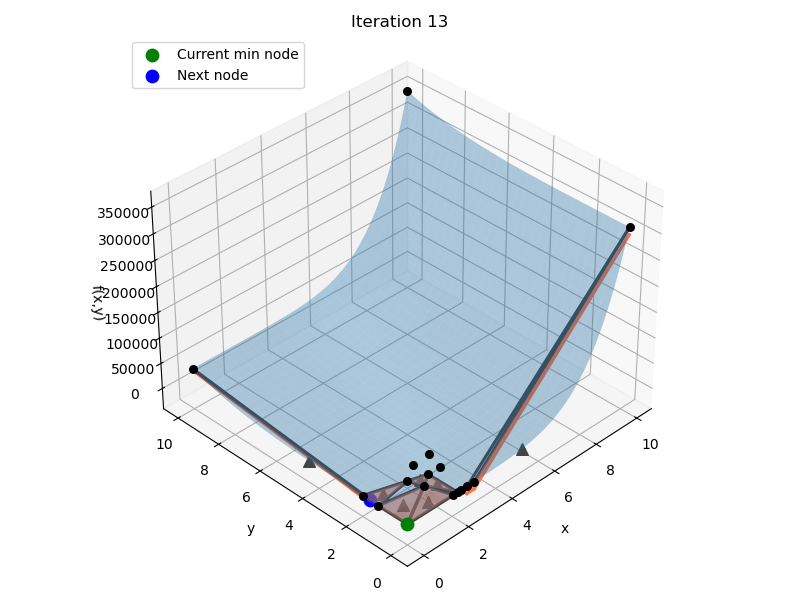

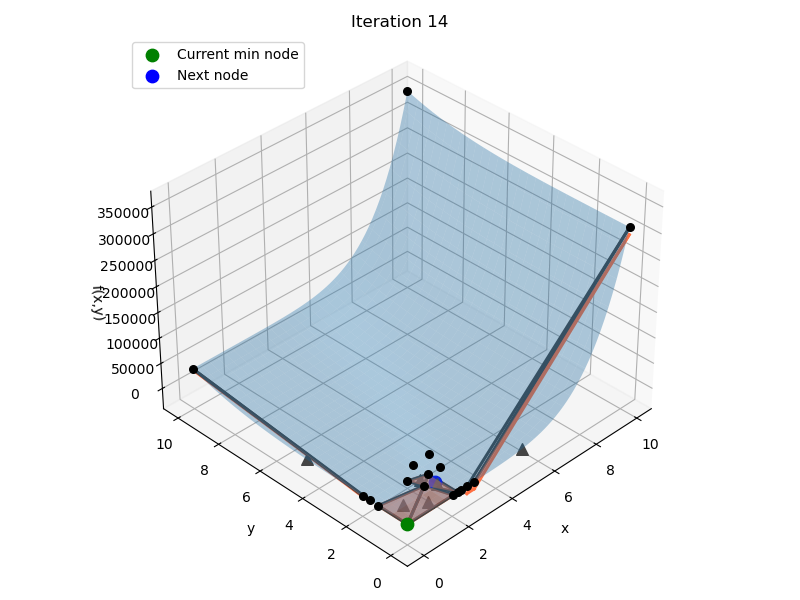

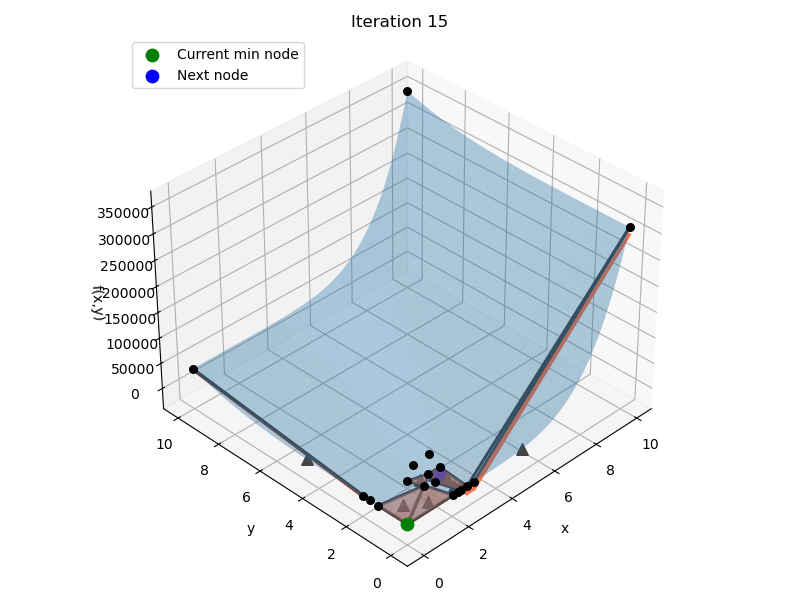

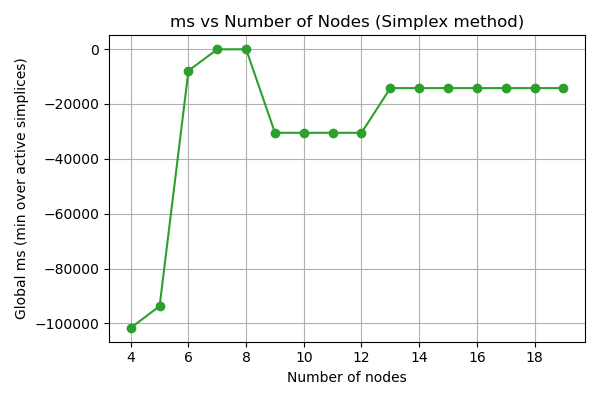


==== Summary Table ====
   Nodes |           ms |           LB |           UB
-----------------------------------------------------
       4 | -101597.1010 |  -70430.9372 |       0.0000
       5 |  -93711.1019 |   -7872.0002 |       0.0000
       6 |   -7872.0002 |     -99.5336 |       0.0000
       7 |     -99.5336 |     -98.4706 |       0.0000
       8 |     -72.0036 |     -26.5395 |       0.0000
       9 |  -30527.6674 |      -9.2558 |       0.0000
      10 |  -30527.6674 |      -9.2558 |       0.0000
      11 |  -30527.6674 |      -9.2558 |       0.0000
      12 |  -30527.6674 |      -8.9168 |       0.0000
      13 |  -14231.1592 |      -8.9168 |       0.0000
      14 |  -14231.1592 |      -2.1028 |       0.0000
      15 |  -14231.1592 |      -7.8429 |       0.0000
      16 |  -14231.1592 |      -7.8429 |       0.0000
      17 |  -14231.1592 |      -1.4556 |       0.0000
      18 |  -14231.1592 |      -1.4556 |       0.0000
      19 |  -14231.1592 |      -1.4556 |       0.0000
---

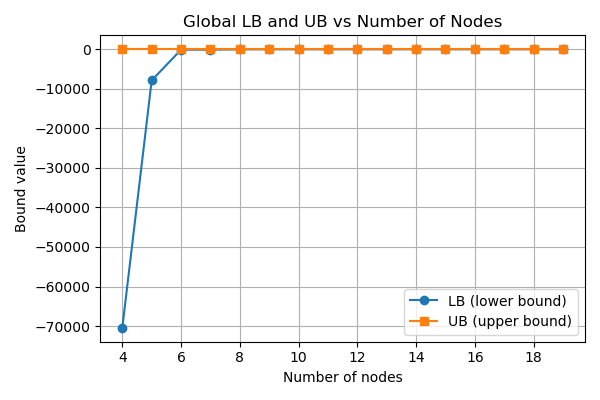

In [7]:
def drop_simplex_stuff(m):
    for nm in ['lam','lam_sum','x_link_x','x_link_y','As','As_con','obj']:
        if hasattr(m, nm):
            m.del_component(nm)

# ======== 每个三角形里求 ms、LB、UB ========
def minimize_on_each_triangle(nodes, values, solver='ipopt', tee=False):
    pts  = np.asarray(nodes, dtype=float)   # (N,2)
    vals = np.asarray(values, dtype=float)  # (N,)
    tri = Delaunay(pts)                     # tri.simplices: (K,3)

    m = build_model()
    opt = pyo.SolverFactory(solver)
    if solver == "gurobi":
        opt.options["NonConvex"] = 2


    results = []
    for k, simp in enumerate(tri.simplices):
        verts = pts[simp]     # (3,2)
        fverts= vals[simp]    # (3,)

        # 重心变量 lam_j >=0, sum lam =1
        m.lam = pyo.Var(range(3), domain=pyo.NonNegativeReals)
        m.lam_sum = pyo.Constraint(expr=sum(m.lam[j] for j in range(3)) == 1.0)

        # x = sum lam_j * v_jx,  y = sum lam_j * v_jy
        m.x_link_x = pyo.Constraint(expr=m.x == sum(m.lam[j]*float(verts[j,0]) for j in range(3)))
        m.x_link_y = pyo.Constraint(expr=m.y == sum(m.lam[j]*float(verts[j,1]) for j in range(3)))

        # As = sum lam_j * f(v_j)
        m.As = pyo.Var()
        m.As_con = pyo.Constraint(expr=m.As == sum(m.lam[j]*float(fverts[j]) for j in range(3)))

        # 目标：min f(x,y) - As
        m.obj = pyo.Objective(expr=f_true_expr(m) - m.As, sense=pyo.minimize)

        res = opt.solve(m, tee=tee)

        x_ms = np.array([pyo.value(m.x), pyo.value(m.y)], dtype=float)
        ms_val = float(pyo.value(m.obj))     # min_x [f - As]
        f_at_x_ms = f_true_numpy(x_ms)

        # LB = min As + ms = min f(顶点) + ms
        LB = float(np.min(fverts) + ms_val)
        # UB（报告用） = min( f(顶点), f(x_ms) )
        UB = float(min(np.min(fverts), f_at_x_ms))

        results.append({
            "simplex_index": int(k),
            "vertices_index": simp.tolist(),
            "verts": verts,
            "fverts": fverts,
            "x_ms": x_ms,
            "ms": ms_val,
            "LB": LB,
            "UB": UB,
            "f(x_ms)": f_at_x_ms,
            "status": str(res.solver.status),
            "term": str(res.solver.termination_condition),
        })

        drop_simplex_stuff(m)

    return tri, results

def compute_lb_min_node_max_ms(nodes, values, per_tri):
    """
    根据你的新口径计算本轮全局 LB：
      LB_iter = f(v*) + max{ ms_triangle | v* 属于该三角形 }
    若极少数退化情形找不到包含 v* 的三角形（理论上不该发生），
    就回退为原口径：min_tri (min(fverts) + ms).
    """
    idx_min = int(np.argmin(values))
    ms_candidates = [r['ms'] for r in per_tri if idx_min in r['vertices_index']]
    if ms_candidates:
        return float(values[idx_min] + max(ms_candidates)), idx_min, float(max(ms_candidates))
    # fallback（几乎不会触发）
    fallback = float(min(r['LB'] for r in per_tri))
    return fallback, idx_min, float('nan')

def pick_candidate_by_ms_rank(per_tri, nodes, min_dist=1e-6, descending=False):
    """
    在 per_tri 中按 ms 排序（默认从大到小），依次找与已有 nodes 距离>=min_dist 的 x_ms。
    返回: new_node(np.array([x,y])), used_rank(int), used_ms(float)
    若所有候选都过近，则返回 None, None, None 让主流程采取 fallback（比如放宽阈值或改用几何替代）。
    """
    # 排序：ms 最大→最小（descending=True）；若想回到“ms 最小优先”，把 descending=False
    cands = sorted(per_tri, key=lambda r: r['ms'], reverse=descending)

    def ok(p):
        return all(np.linalg.norm(p - q) >= min_dist for q in nodes)

    for rank, r in enumerate(cands, start=1):
        p = np.array(r['x_ms'], float)
        if ok(p):
            return p, rank, float(r['ms'])

    return None, None, None

# ========= not important =============================
# ======== 在单形法运行结束后，统计 LB / ms 并绘图 ========
def analyze_singlex_results(max_nodes=10):
    # 运行一次完整的单形法，记录每轮 global LB 与 ms
    LB_hist, ms_hist, node_count = [], [], []
    nodes = [
        np.array([0.0, 0.0]),
        np.array([0.0,10.0]),
        np.array([10.0,0.0]),
        np.array([10.0,10.0]),
    ]
    values = [f_true_numpy(p) for p in nodes]
    it = 0

    while len(nodes) < max_nodes:
        tri, per_tri = minimize_on_each_triangle(nodes, values, solver='ipopt', tee=False)

        # 全局剪枝 UB（当前节点集的最小 f 值）
        UB_prune = float(np.min(values))
        # 新口径：最小值节点 v* 的 f(v*) + max_{Δ∋v*} ms_Δ
        LB_iter, idx_min_node, ms_chosen = compute_lb_min_node_max_ms(nodes, values, per_tri)

        # ms = 所有单形中 min(ms)
        ms_iter = min(r['ms'] for r in per_tri)

        LB_hist.append(LB_iter)
        ms_hist.append(ms_iter)
        node_count.append(len(nodes))

        # 加点
        best_tri = min(per_tri, key=lambda r: r['ms'])
        new_node = np.array(best_tri['x_ms'], float)
        if any(np.linalg.norm(new_node - q) < 1e-6 for q in nodes):
            break
        nodes.append(new_node)
        values.append(f_true_numpy(new_node))
        it += 1
        if len(nodes) >= max_nodes:
            break

    # ======== 画图 ========
    plt.figure(figsize=(6,4))
    plt.plot(node_count, LB_hist, marker='o')
    plt.xlabel("Number of nodes")
    plt.ylabel("Global LB")
    plt.title("LB vs Number of Nodes (Simplex method)")
    plt.grid(True)
    plt.tight_layout()

    plt.figure(figsize=(6,4))
    plt.plot(node_count, ms_hist, marker='o')
    plt.xlabel("Number of nodes")
    plt.ylabel("Global ms (min over active simplices)")
    plt.title("ms vs Number of Nodes (Simplex method)")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return node_count, LB_hist, ms_hist


# ======== 打印“列=三角形”的表格 ========
def print_per_triangle_table(results, active_mask):
    """
    严格对齐 + 整列着色版本：
      - 列=三角形；第1行=UB，第2行=LB，第3行=ms
      - active 列整列红色（含表头与该列的所有单元格）
      - 使用 ANSI 颜色（Windows 旧 cmd 需 colorama.init()）
    """
    # 1) 整理数据（保持按 simplex_index 的顺序）
    results = sorted(results, key=lambda r: r["simplex_index"])
    simplex_ids = [r["simplex_index"] for r in results]
    active_set = {sid for sid in simplex_ids if active_mask[sid]}

    # 构建纯文本表（不带颜色，用来计算宽度）
    header = ["row\\simp"] + [f"T{sid}{'*' if sid in active_set else ''}" for sid in simplex_ids]
    rows = [
        ["UB"] + [f"{r['UB']:.6f}" for r in results],
        ["LB"] + [f"{r['LB']:.6f}" for r in results],
        ["ms"] + [f"{r['ms']:.3e}" for r in results],
    ]
    table = [header] + rows

    # 2) 计算每一列的最大宽度（纯文本宽度）
    ncols = len(header)
    colw = [0]*ncols
    for c in range(ncols):
        colw[c] = max(len(str(row[c])) for row in table) + 2  # 预留空格

    # 3) 打印（先 padding，再套颜色 → 颜色码不影响对齐）
    RED = "\033[31m"
    RESET = "\033[0m"

    def colorize_if_active(col_idx: int, s: str) -> str:
        # col_idx>0 才对应某个 simplex 列；col 0 是行名
        if col_idx == 0:
            return s
        sid = simplex_ids[col_idx-1]
        return f"{RED}{s}{RESET}" if sid in active_set else s

    # 表头
    header_line = "".join(str(header[c]).ljust(colw[c]) if c == 0
                          else colorize_if_active(c, str(header[c]).ljust(colw[c]))
                          for c in range(ncols))
    print("\n== Per-triangle summary ==")
    print(header_line)

    # 分隔线
    print("-" * sum(colw))

    # 数据行
    for r in rows:
        line = []
        for c in range(ncols):
            cell = str(r[c])
            # 首列左对齐，其它列右对齐更好看
            padded = cell.ljust(colw[c]) if c == 0 else cell.rjust(colw[c])
            line.append(colorize_if_active(c, padded))
        print("".join(line))

    print("(红色列 = active；第1行=UB，第2行=LB，第3行=ms)\n")



# ======== 绘图：曲面 + 节点 + active 三角形 ========
def plot_iteration(iter_id, nodes, tri, active_mask,
                   grid_n=60, elev=35, azim=-135,
                   min_node=None, new_node=None,
                   per_tri=None):
    nodes = np.asarray(nodes, float)

    # === 颜色与线宽（方案一） ===
    COLOR_SURFACE = 'C0'           # 原函数曲面：保留蓝色
    COLOR_NODE_EDGES = '#444444'   # 原函数上的节点连线（active）
    COLOR_PIECE = '#ff7043'        # As+ms 分片（面+边，active）
    LW_MAIN = 2.2                  # 节点连线与分片边线统一粗度

    # --- 原函数栅格 ---
    xs = np.linspace(0, 10, grid_n)
    ys = np.linspace(0, 10, grid_n)
    XX, YY = np.meshgrid(xs, ys)
    # 用双高斯坑
    ZZ = np.zeros_like(XX)
    for i in range(XX.shape[0]):
        for j in range(XX.shape[1]):
            ZZ[i,j] = f_true_numpy([XX[i,j], YY[i,j]])

    fig = plt.figure(figsize=(8,6))
    ax = fig.add_subplot(111, projection='3d')

    # 原函数曲面（蓝色，半透明）
    ax.plot_surface(XX, YY, ZZ, alpha=0.35, linewidth=0, antialiased=True, color=COLOR_SURFACE)

    # === 只画 active 分片：As+ms（面 + 边） ===
    if per_tri is not None and len(per_tri) > 0 and tri is not None:
        faces = []
        # 先收集面
        for r in per_tri:
            sid = r["simplex_index"]
            if not active_mask.get(sid, False):
                continue
            verts_xy = r["verts"]     # (3,2)
            fverts   = r["fverts"]    # (3,)
            ms_val   = r["ms"]
            tri_xyz  = [(verts_xy[i,0], verts_xy[i,1], float(fverts[i] + ms_val)) for i in range(3)]
            faces.append(tri_xyz)

        if faces:
            coll = Poly3DCollection(faces, facecolors=[COLOR_PIECE],
                                    edgecolors='none', alpha=0.55)
            ax.add_collection3d(coll)

        # 再为每个 active 分片画“贴在 As+ms 上”的边线（与节点连线同粗）
        for r in per_tri:
            sid = r["simplex_index"]
            if not active_mask.get(sid, False):
                continue
            verts_xy = r["verts"]
            fverts   = r["fverts"]
            ms_val   = r["ms"]
            # 三条边（在 As+ms 面上）
            for i in range(3):
                a_xy = verts_xy[i]
                b_xy = verts_xy[(i+1) % 3]
                za = float(fverts[i] + ms_val)
                zb = float(fverts[(i+1) % 3] + ms_val)
                ax.plot([a_xy[0], b_xy[0]], [a_xy[1], b_xy[1]], [za, zb],
                        lw=LW_MAIN, c=COLOR_PIECE)

    # 所有节点：黑点
    node_z = np.array([f_true_numpy(p) for p in nodes])
    ax.scatter(nodes[:,0], nodes[:,1], node_z, s=30, c='k', depthshade=False)

    # === 原函数上的“节点连线”：只画 active 三角形的边，颜色改为深灰，粗度与分片边一致 ===
    if tri is not None:
        for k, simp in enumerate(tri.simplices):
            if not active_mask.get(k, False):
                continue
            verts_xy = tri.points[simp]
            for i in range(3):
                a, b = verts_xy[i], verts_xy[(i+1) % 3]
                ax.plot([a[0], b[0]], [a[1], b[1]],
                        [f_true_numpy(a), f_true_numpy(b)],
                        lw=LW_MAIN, c=COLOR_NODE_EDGES)

            # active 三角形质心标记（可留可去）
            centroid = np.mean(verts_xy, axis=0)
            ax.scatter([centroid[0]], [centroid[1]], [f_true_numpy(centroid)],
                       marker='^', c=COLOR_NODE_EDGES, s=70, depthshade=False)

    # 绿色点：当前最小值节点
    if min_node is not None:
        ax.scatter([min_node[0]], [min_node[1]], [f_true_numpy(min_node)],
                   color='g', s=80, marker='o', label='Current min node')

    # 蓝色点：下一轮将加入的新节点
    if new_node is not None:
        ax.scatter([new_node[0]], [new_node[1]], [f_true_numpy(new_node)],
                   color='b', s=80, marker='o', label='Next node')

    ax.set_title(f"Iteration {iter_id}")
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("f(x,y)")
    ax.legend(loc='upper left')
    ax.view_init(elev=elev, azim=azim)
    plt.tight_layout()
    plt.show()


def plot_convergence(hist, prec=4):
    import matplotlib.pyplot as plt

    x  = hist["node_count"]
    LB = hist["LB_hist"]
    UB = hist["UB_hist"]
    ms = hist["ms_hist"]

    # ---- 图1：LB 与 UB ----
    plt.figure(figsize=(6,4))
    plt.plot(x, LB, marker='o', label="LB (lower bound)")
    plt.plot(x, UB, marker='s', label="UB (upper bound)")
    plt.xlabel("Number of nodes")
    plt.ylabel("Bound value")
    plt.title("Global LB and UB vs Number of Nodes")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()

    # ---- 图2：ms 收敛 ----
    plt.figure(figsize=(6,4))
    plt.plot(x, ms, marker='o', color='C2')
    plt.xlabel("Number of nodes")
    plt.ylabel("Global ms (min over active simplices)")
    plt.title("ms vs Number of Nodes (Simplex method)")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # ---- 表格打印 ----
    print("\n==== Summary Table ====")
    fmt = f"{{:.{prec}f}}"  # 动态控制小数位
    header = f"{'Nodes':>8s} | {'ms':>12s} | {'LB':>12s} | {'UB':>12s}"
    print(header)
    print("-" * len(header))
    for n, m, lb, ub in zip(x, ms, LB, UB):
        print(f"{n:8d} | {fmt.format(m):>12s} | {fmt.format(lb):>12s} | {fmt.format(ub):>12s}")
    print("-" * len(header))
    print(f"{'Total':>8s} | {len(x):>12d}")




# ======== 主循环 ========
def run_case(max_nodes=10, solver='ipopt', tee=False, plot_grid_n=60,
             record_history=True, make_3d_plots=True,
             only_from_active=True, min_dist=1e-4, active_tol=1e-8):
    """
    only_from_active: True 则新点只在 active 单形中选择；若本轮无 active，则回退到全体单形
    min_dist:        与已有节点的最小间距阈值（去重）
    active_tol:      判定 active 的容差：LB <= UB_global + active_tol
    """
    # 初始四角
    nodes = [np.array([0.0,0.0]), np.array([0.0,10.0]),
             np.array([10.0,0.0]), np.array([10.0,10.0])]
    values = [f_true_numpy(p) for p in nodes]

    # 历史
    LB_hist, UB_hist, ms_hist, node_count = [], [], [], []

    it = 0
    while len(nodes) < max_nodes:
        tri, per_tri = minimize_on_each_triangle(nodes, values, solver=solver, tee=tee)

        # 本轮全局 UB（基于现有节点的最小真实值）
        UB_global = float(np.min(values))

        # 你的口径：min-node 的 f(v*) + 其相邻单形的 max ms
        LB_iter, idx_min_node, ms_chosen = compute_lb_min_node_max_ms(nodes, values, per_tri)

        # 记录一个“ms 指标”：所有单形的最小 ms（你当前用法）
        ms_iter = min(r['ms'] for r in per_tri)

        if record_history:
            LB_hist.append(LB_iter)
            UB_hist.append(UB_global)
            ms_hist.append(ms_iter)
            node_count.append(len(nodes))

        # 计算 active 掩码与候选集合
        active_mask = { r['simplex_index']: (r['LB'] <= UB_global + active_tol) for r in per_tri }
        active_tris = [r for r in per_tri if r['LB'] <= UB_global + active_tol]
        candidates = active_tris if (only_from_active and len(active_tris) > 0) else per_tri
        if only_from_active and len(active_tris) == 0:
            print(f"[warn] No active simplices this round (tol={active_tol:g}); fall back to all simplices.")

        # 选新点：在 candidates 中按 ms 排序（ms 最小优先）
        new_node, used_rank, used_ms = pick_candidate_by_ms_rank(
            candidates, nodes, min_dist=min_dist, descending=False
        )
        if new_node is None:
            print("All candidates too close; stop.")
            break

        # 可视化
        if make_3d_plots:
            plot_iteration(it, nodes, tri, active_mask,
                           grid_n=plot_grid_n,
                           min_node=nodes[idx_min_node],
                           new_node=new_node, per_tri=per_tri)

        # 去重后加入一次
        if any(np.linalg.norm(new_node - q) < min_dist for q in nodes):
            print("New node too close to an existing node; stop.")
            break
        nodes.append(new_node)
        values.append(f_true_numpy(new_node))

        it += 1

    return {
        "nodes": np.array(nodes), "values": np.array(values),
        "LB_hist": LB_hist, "UB_hist": UB_hist, "ms_hist": ms_hist,
        "node_count": node_count
    }




# ======== 调用示例 ========
if __name__ == "__main__":
    solver      = "ipopt"
    max_nodes   = 20
    plot_3d     = True
    record_hist = True

    hist_simp = run_case(
        max_nodes=max_nodes,
        solver=solver,
        tee=False,
        plot_grid_n=60,
        record_history=record_hist,
        make_3d_plots=plot_3d
    )

    # 默认四位小数，可改成比如 prec=6
    plot_convergence(hist_simp, prec=4)

    nodes  = hist_simp["nodes"]
    values = hist_simp["values"]
    print("\n==== Done ====")
    print(f"Total nodes: {len(nodes)}")
    print(f"Best f among nodes: {np.min(values):.6f}")


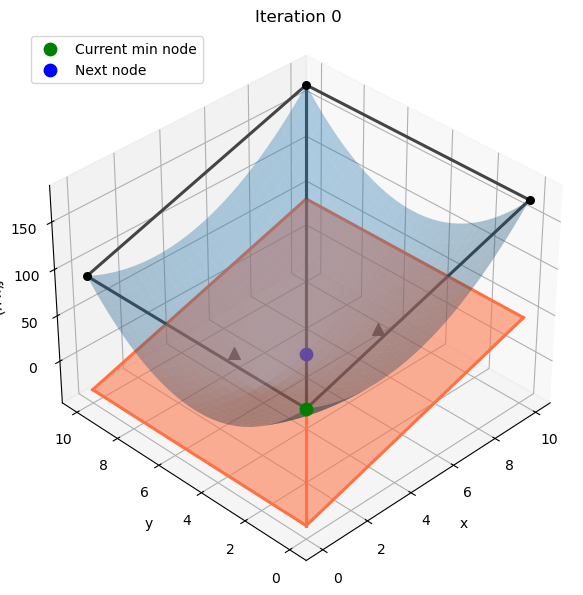

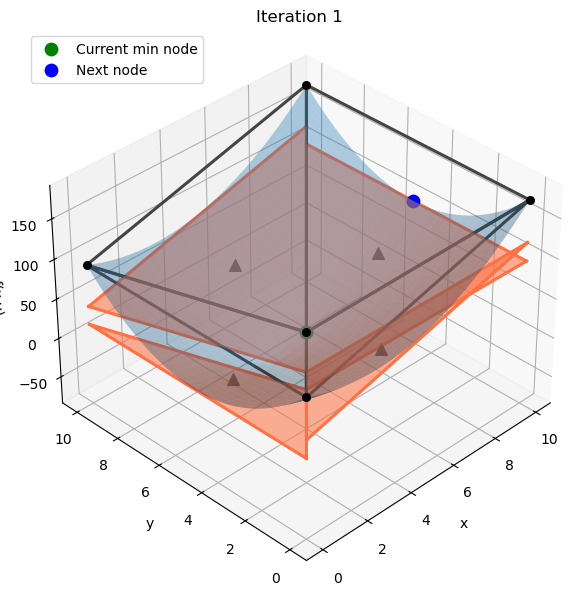

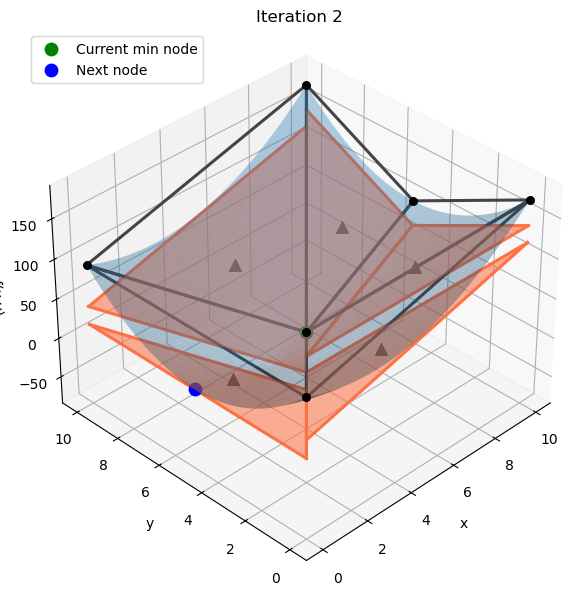

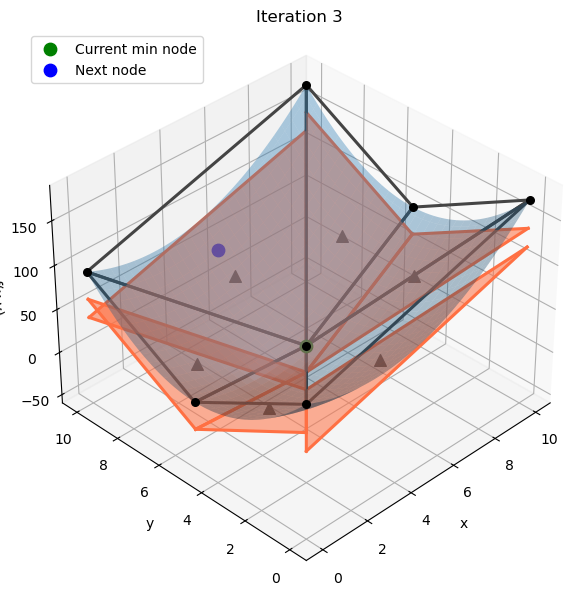

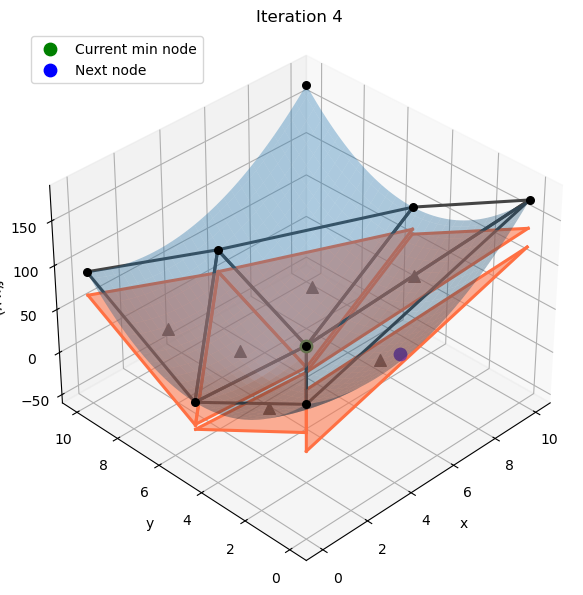

...

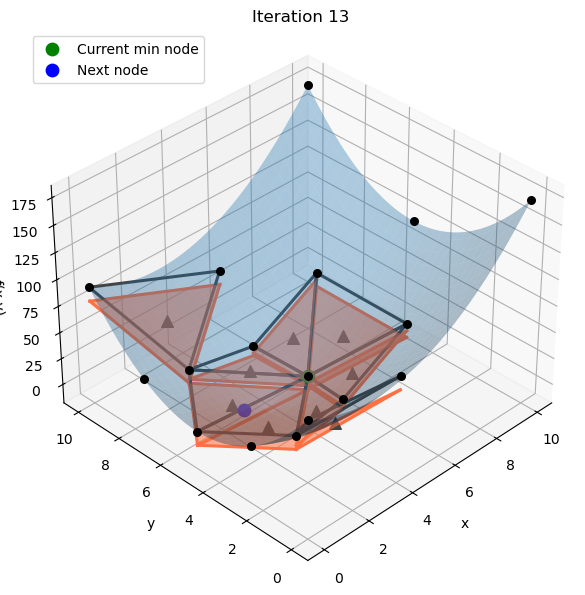

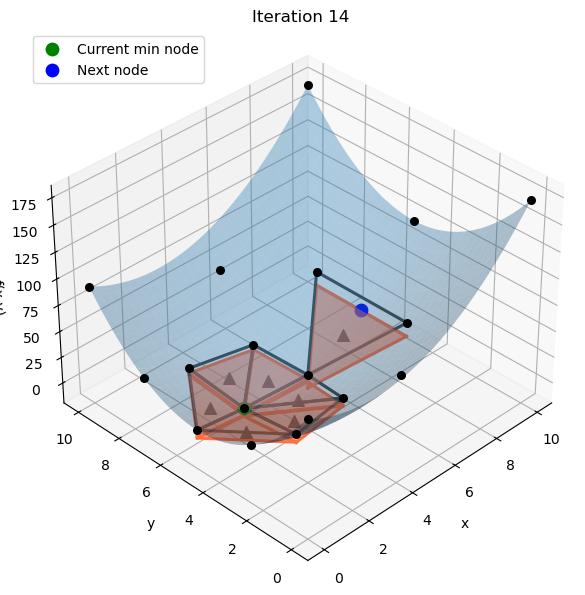

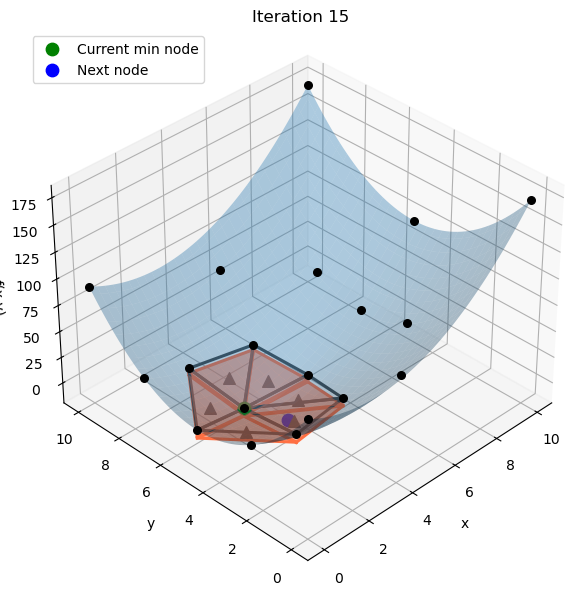

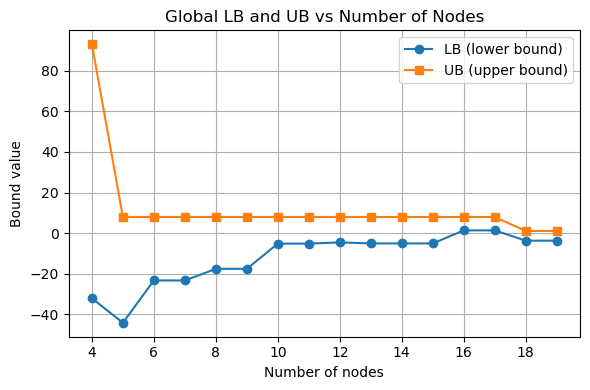

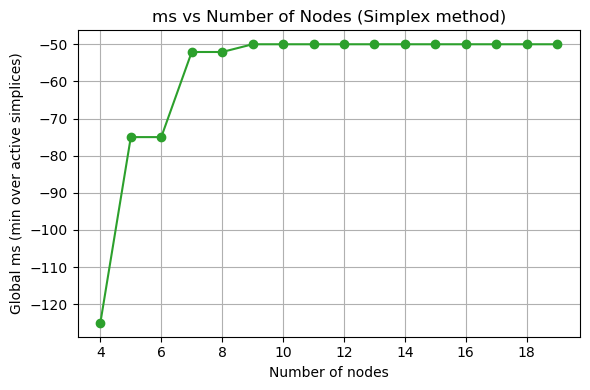


==== Summary Table ====
   Nodes |           ms |           LB |           UB
-----------------------------------------------------
       4 |    -125.0000 |     -32.0000 |      93.0000
       5 |     -75.0000 |     -44.0831 |       8.0002
       6 |     -75.0000 |     -23.2496 |       8.0002
       7 |     -52.0834 |     -23.2496 |       8.0002
       8 |     -52.0833 |     -17.5206 |       8.0002
       9 |     -50.0000 |     -17.5206 |       8.0002
      10 |     -50.0000 |      -5.1151 |       8.0002
      11 |     -50.0000 |      -5.1151 |       8.0002
      12 |     -50.0000 |      -4.5049 |       8.0002
      13 |     -50.0000 |      -5.0205 |       8.0002
      14 |     -50.0000 |      -5.0205 |       8.0002
      15 |     -50.0000 |      -5.0205 |       8.0002
      16 |     -50.0000 |       1.3981 |       8.0002
      17 |     -50.0000 |       1.3981 |       8.0002
      18 |     -50.0000 |      -3.6607 |       1.1151
      19 |     -50.0000 |      -3.6607 |       1.1151
---

In [ ]:
import numpy as np
from scipy.spatial import Delaunay
import pyomo.environ as pyo
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
# %matplotlib widget  # 你在notebook里再打开

# =========================================================
# 真实函数（demo用，后面可以换成场景期望值）
# =========================================================
def f_true_numpy(xy):
    x, y = float(xy[0]), float(xy[1])
    return 2.0*(x - 3.0)**2 + 3.0*(y - 5.0)**2

def f_true_expr(m):
    return 2*(m.x - 3)**2 + 3*(m.y - 5)**2


# =========================================================
# 1. build_model(): 返回 (m, fsv)
#    fsv 是一阶段变量（顺序固定的列表）
# =========================================================
def build_model():
    m = pyo.ConcreteModel()
    m.x = pyo.Var(bounds=(0.0, 10.0))
    m.y = pyo.Var(bounds=(0.0, 10.0))

    # first-stage vars list, 顺序就是坐标顺序
    fsv = [m.x, m.y]

    return m, fsv


# =========================================================
# 小工具：把我们在 simplex 求解时加过的组件删掉，避免累积定义冲突
# =========================================================
def drop_simplex_stuff(m):
    for nm in ['lam','lam_sum','x_link_x','x_link_y','As','As_con','obj']:
        if hasattr(m, nm):
            m.del_component(nm)


# =========================================================
# 2. generate_corners(fsv)
#    - 自动从 fsv 中读取每个变量的 lb/ub
#    - 生成所有 2^d 的角点
# =========================================================
def generate_corners(fsv):
    # 取得每个变量的上下界
    lows  = []
    highs = []
    for v in fsv:
        lo = v.lb
        hi = v.ub
        lows.append(float(lo))
        highs.append(float(hi))
    lows  = np.array(lows, dtype=float)
    highs = np.array(highs, dtype=float)
    d = len(fsv)
    # 遍历所有 bit pattern
    nodes = []
    for mask in range(1 << d):  # 0 .. 2^d-1
        point = []
        for i in range(d):
            if (mask >> i) & 1:
                point.append(highs[i])
            else:
                point.append(lows[i])
        nodes.append(np.array(point, dtype=float))
    return nodes


# =========================================================
# 3. evaluate_objective_at(node)
#    - 目前用 f_true_numpy
#    - 以后可以替换成“多场景期望值”
# =========================================================
def evaluate_objective_at(node):
    return f_true_numpy(node)


# =========================================================
# 计算每个单形上的 ms / LB / UB
# 注意：我们这里假设是2D问题（三角形）。如果是3D你会相应改成四面体等。
# =========================================================
def minimize_on_each_triangle(nodes, values, solver='ipopt', tee=False):
    pts  = np.asarray(nodes, dtype=float)   # (N,2)
    vals = np.asarray(values, dtype=float)  # (N,)
    tri = Delaunay(pts)                     # tri.simplices: (K,3)

    # 注意：这里我们重新 build_model() 只是为了拿到 m 的结构
    # 对于单场景，这没问题；多场景版本你以后会传进来现成的模型
    m_base, _ = build_model()
    opt = pyo.SolverFactory(solver)
    if solver == "gurobi":
        opt.options["NonConvex"] = 2

    results = []
    for k, simp in enumerate(tri.simplices):
        verts = pts[simp]     # (3,2)
        fverts= vals[simp]    # (3,)

        # 在一个 fresh 的模型上加 simplex 相关变量和约束
        # （我们 clone 一个新模型 m = m_base.clone()，避免污染 m_base）
        m = m_base.clone()

        m.lam = pyo.Var(range(3), domain=pyo.NonNegativeReals)
        m.lam_sum = pyo.Constraint(expr=sum(m.lam[j] for j in range(3)) == 1.0)

        # x = sum lam_j * v_jx,  y = sum lam_j * v_jy
        m.x_link_x = pyo.Constraint(expr=m.x == sum(m.lam[j]*float(verts[j,0]) for j in range(3)))
        m.x_link_y = pyo.Constraint(expr=m.y == sum(m.lam[j]*float(verts[j,1]) for j in range(3)))

        # As = sum lam_j * f(v_j)
        m.As = pyo.Var()
        m.As_con = pyo.Constraint(expr=m.As == sum(m.lam[j]*float(fverts[j]) for j in range(3)))

        # 目标：min f(x,y) - As
        m.obj = pyo.Objective(expr=f_true_expr(m) - m.As, sense=pyo.minimize)

        res = opt.solve(m, tee=tee)

        x_ms = np.array([pyo.value(m.x), pyo.value(m.y)], dtype=float)
        ms_val = float(pyo.value(m.obj))     # min_x [f - As]
        f_at_x_ms = f_true_numpy(x_ms)

        # LB = min As + ms = min f(顶点) + ms
        LB = float(np.min(fverts) + ms_val)
        # UB（报告用） = min( f(顶点), f(x_ms) )
        UB = float(min(np.min(fverts), f_at_x_ms))

        results.append({
            "simplex_index": int(k),
            "vertices_index": simp.tolist(),
            "verts": verts,
            "fverts": fverts,
            "x_ms": x_ms,
            "ms": ms_val,
            "LB": LB,
            "UB": UB,
            "f(x_ms)": f_at_x_ms,
            "status": str(res.solver.status),
            "term": str(res.solver.termination_condition),
        })

        # 我们用 clone() 每次新 m，不需要 drop_simplex_stuff() 了
        # 但保留函数本身以备后续你想复用一个 m 的时候

    return tri, results


# =========================================================
# LB = f(v*) + max ms among triangles containing v*
# =========================================================
def compute_lb_min_node_max_ms(nodes, values, per_tri):
    idx_min = int(np.argmin(values))
    ms_candidates = [r['ms'] for r in per_tri if idx_min in r['vertices_index']]
    if ms_candidates:
        return float(values[idx_min] + max(ms_candidates)), idx_min, float(max(ms_candidates))
    # fallback
    fallback = float(min(r['LB'] for r in per_tri))
    return fallback, idx_min, float('nan')


# =========================================================
# 从一组选定三角形记录里挑 next node
# =========================================================
def pick_candidate_by_ms_rank(per_tri, nodes, min_dist=1e-6, descending=False):
    """
    per_tri: list of triangle dicts
    nodes:   current list of node coords
    descending=False -> ms 最小优先 (默认)
    """
    cands = sorted(per_tri, key=lambda r: r['ms'], reverse=descending)

    def ok(p):
        return all(np.linalg.norm(p - q) >= min_dist for q in nodes)

    for rank, r in enumerate(cands, start=1):
        p = np.array(r['x_ms'], float)
        if ok(p):
            return p, rank, float(r['ms'])

    return None, None, None


# =========================================================
# 可视化（基本保持你的版本）
# =========================================================
def plot_iteration(iter_id, nodes, tri, active_mask,
                   grid_n=60, elev=35, azim=-135,
                   min_node=None, new_node=None,
                   per_tri=None):
    nodes = np.asarray(nodes, float)

    COLOR_SURFACE = 'C0'
    COLOR_NODE_EDGES = '#444444'
    COLOR_PIECE = '#ff7043'
    LW_MAIN = 2.2

    # 网格化原函数
    # 注意这里只是2D可视化版本
    xs = np.linspace(0, 10, grid_n)
    ys = np.linspace(0, 10, grid_n)
    XX, YY = np.meshgrid(xs, ys)
    ZZ = np.zeros_like(XX)
    for i in range(XX.shape[0]):
        for j in range(XX.shape[1]):
            ZZ[i,j] = f_true_numpy([XX[i,j], YY[i,j]])

    fig = plt.figure(figsize=(8,6))
    ax = fig.add_subplot(111, projection='3d')

    ax.plot_surface(XX, YY, ZZ, alpha=0.35, linewidth=0,
                    antialiased=True, color=COLOR_SURFACE)

    # 画 active 分片 As+ms
    if per_tri is not None and len(per_tri) > 0 and tri is not None:
        faces = []
        for r in per_tri:
            sid = r["simplex_index"]
            if not active_mask.get(sid, False):
                continue
            verts_xy = r["verts"]     # (3,2)
            fverts   = r["fverts"]    # (3,)
            ms_val   = r["ms"]
            tri_xyz  = [(verts_xy[i,0], verts_xy[i,1], float(fverts[i] + ms_val)) for i in range(3)]
            faces.append(tri_xyz)

        if faces:
            coll = Poly3DCollection(faces,
                                    facecolors=[COLOR_PIECE],
                                    edgecolors='none', alpha=0.55)
            ax.add_collection3d(coll)

        # 分片边线
        for r in per_tri:
            sid = r["simplex_index"]
            if not active_mask.get(sid, False):
                continue
            verts_xy = r["verts"]
            fverts   = r["fverts"]
            ms_val   = r["ms"]
            for i in range(3):
                a_xy = verts_xy[i]
                b_xy = verts_xy[(i+1) % 3]
                za = float(fverts[i] + ms_val)
                zb = float(fverts[(i+1) % 3] + ms_val)
                ax.plot([a_xy[0], b_xy[0]],
                        [a_xy[1], b_xy[1]],
                        [za, zb],
                        lw=LW_MAIN, c=COLOR_PIECE)

    # 所有节点
    node_z = np.array([f_true_numpy(p) for p in nodes])
    ax.scatter(nodes[:,0], nodes[:,1], node_z,
               s=30, c='k', depthshade=False)

    # active 三角形在真函数表面上的边
    if tri is not None:
        for k, simp in enumerate(tri.simplices):
            if not active_mask.get(k, False):
                continue
            verts_xy = tri.points[simp]
            for i in range(3):
                a, b = verts_xy[i], verts_xy[(i+1) % 3]
                ax.plot([a[0], b[0]], [a[1], b[1]],
                        [f_true_numpy(a), f_true_numpy(b)],
                        lw=LW_MAIN, c=COLOR_NODE_EDGES)

            centroid = np.mean(verts_xy, axis=0)
            ax.scatter([centroid[0]], [centroid[1]],
                       [f_true_numpy(centroid)],
                       marker='^', c=COLOR_NODE_EDGES,
                       s=70, depthshade=False)

    # 当前最优点（绿色）
    if min_node is not None:
        ax.scatter([min_node[0]], [min_node[1]],
                   [f_true_numpy(min_node)],
                   color='g', s=80, marker='o',
                   label='Current min node')

    # 下一候选点（蓝色）
    if new_node is not None:
        ax.scatter([new_node[0]], [new_node[1]],
                   [f_true_numpy(new_node)],
                   color='b', s=80, marker='o',
                   label='Next node')

    ax.set_title(f"Iteration {iter_id}")
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("f(x,y)")
    ax.legend(loc='upper left')
    ax.view_init(elev=elev, azim=azim)
    plt.tight_layout()
    plt.show()


# =========================================================
# 收敛曲线 (LB / UB / ms)
# =========================================================
def plot_convergence(hist, prec=4):
    x  = hist["node_count"]
    LB = hist["LB_hist"]
    UB = hist["UB_hist"]
    ms = hist["ms_hist"]

    # 图1：LB vs UB
    plt.figure(figsize=(6,4))
    plt.plot(x, LB, marker='o', label="LB (lower bound)")
    plt.plot(x, UB, marker='s', label="UB (upper bound)")
    plt.xlabel("Number of nodes")
    plt.ylabel("Bound value")
    plt.title("Global LB and UB vs Number of Nodes")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()

    # 图2：ms
    plt.figure(figsize=(6,4))
    plt.plot(x, ms, marker='o', color='C2')
    plt.xlabel("Number of nodes")
    plt.ylabel("Global ms (min over active simplices)")
    plt.title("ms vs Number of Nodes (Simplex method)")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # 打印表格
    print("\n==== Summary Table ====")
    fmt = f"{{:.{prec}f}}"
    header = f"{'Nodes':>8s} | {'ms':>12s} | {'LB':>12s} | {'UB':>12s}"
    print(header)
    print("-" * len(header))
    for n, m_val, lb, ub in zip(x, ms, LB, UB):
        print(f"{n:8d} | {fmt.format(m_val):>12s} | {fmt.format(lb):>12s} | {fmt.format(ub):>12s}")
    print("-" * len(header))
    print(f"{'Total':>8s} | {len(x):>12d}")


# =========================================================
# 4. run_case(...) 入口改造
#    - 现在不硬编码四角
#    - 而是吃 init_nodes/init_values
# =========================================================
def run_case(init_nodes,
             init_values,
             max_nodes=10,
             solver='ipopt',
             tee=False,
             plot_grid_n=60,
             record_history=True,
             make_3d_plots=True,
             only_from_active=True,
             min_dist=1e-4,
             active_tol=1e-8):
    """
    init_nodes: list of np.array([...]) 由 generate_corners() 给出
    init_values: list of float           对应每个 init_node 的目标函数值
    other args 同前
    """

    # 初始化
    nodes  = [np.array(p, dtype=float) for p in init_nodes]
    values = [float(v) for v in init_values]

    LB_hist, UB_hist, ms_hist, node_count = [], [], [], []

    it = 0
    while len(nodes) < max_nodes:
        # Delaunay + per-triangle solve
        tri, per_tri = minimize_on_each_triangle(nodes, values,
                                                 solver=solver, tee=tee)

        # 全局 UB = 当前已有节点的最小真实值
        UB_global = float(np.min(values))

        # LB = f(v*) + max ms for triangles containing v*
        LB_iter, idx_min_node, ms_chosen = compute_lb_min_node_max_ms(
            nodes, values, per_tri
        )

        # ms 指标 = 所有单形中 min(ms)
        ms_iter = min(r['ms'] for r in per_tri)

        if record_history:
            LB_hist.append(LB_iter)
            UB_hist.append(UB_global)
            ms_hist.append(ms_iter)
            node_count.append(len(nodes))

        # active 单形
        active_mask = {
            r['simplex_index']: (r['LB'] <= UB_global + active_tol)
            for r in per_tri
        }
        active_tris = [r for r in per_tri if r['LB'] <= UB_global + active_tol]

        # 候选集合
        candidates = active_tris if (only_from_active and len(active_tris) > 0) else per_tri
        if only_from_active and len(active_tris) == 0:
            print(f"[warn] No active simplices this round (tol={active_tol:g}); "
                  f"fall back to all simplices.")

        # 选新点：ms 最小优先
        new_node, used_rank, used_ms = pick_candidate_by_ms_rank(
            candidates,
            nodes,
            min_dist=min_dist,
            descending=False
        )
        if new_node is None:
            print("All candidates too close; stop.")
            break

        # 可视化
        if make_3d_plots and len(nodes[0]) == 2:
            # 只有2D我们才画3D图面图
            plot_iteration(it, nodes, tri, active_mask,
                           grid_n=plot_grid_n,
                           min_node=nodes[idx_min_node],
                           new_node=new_node,
                           per_tri=per_tri)

        # 去重并加入
        if any(np.linalg.norm(new_node - q) < min_dist for q in nodes):
            print("New node too close to an existing node; stop.")
            break

        nodes.append(new_node)
        values.append(evaluate_objective_at(new_node))

        it += 1

    return {
        "nodes": np.array(nodes),
        "values": np.array(values),
        "LB_hist": LB_hist,
        "UB_hist": UB_hist,
        "ms_hist": ms_hist,
        "node_count": node_count
    }


# =========================================================
# main 示例
# =========================================================
if __name__ == "__main__":
    # 1. 拿到一个模型，和它的 first-stage var list
    m, fsv = build_model()

    # 2. 自动生成角点
    init_nodes = generate_corners(fsv)

    # 3. 对这些角点评价目标函数
    init_values = [evaluate_objective_at(p) for p in init_nodes]

    # 4. 跑主循环
    solver      = "ipopt"
    max_nodes   = 20
    plot_3d     = True
    record_hist = True

    hist_simp = run_case(
        init_nodes=init_nodes,
        init_values=init_values,
        max_nodes=max_nodes,
        solver=solver,
        tee=False,
        plot_grid_n=60,
        record_history=record_hist,
        make_3d_plots=plot_3d,
        only_from_active=True,
        min_dist=1e-4,
        active_tol=1e-8
    )

    # 5. 展示收敛
    plot_convergence(hist_simp, prec=4)

    nodes  = hist_simp["nodes"]
    values = hist_simp["values"]
    print("\n==== Done ====")
    print(f"Total nodes: {len(nodes)}")
    print(f"Best f among nodes: {np.min(values):.6f}")
